In [2]:
import torch

print("PyTorch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

PyTorch version: 2.11.0+cu128
CUDA available: True
GPU: NVIDIA GeForce RTX 3050 Laptop GPU


In [4]:
from ultralytics import YOLO

print("Ultralytics YOLO is working!")

Ultralytics YOLO is working!


In [5]:
from ultralytics import YOLO
import torch

model = YOLO("yolo11n.pt")

print("YOLO model loaded successfully!")
print("GPU available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

YOLO model loaded successfully!
GPU available: True
GPU: NVIDIA GeForce RTX 3050 Laptop GPU


In [6]:
from pathlib import Path

dataset_root = Path(
    r"C:\HOPE AI\AI Course Tamil\Week-11_Deep Learning\Deep Learning-Based PCB Defect Detection\PCB-DATASET-master\PCB-DATASET-master"
)

print("Dataset exists:", dataset_root.exists())

print("\nDataset folders:")
for item in dataset_root.iterdir():
    if item.is_dir():
        print("📁", item.name)

print("\nImage files:", len(list(dataset_root.rglob("*.jpg"))))
print("XML files:", len(list(dataset_root.rglob("*.xml"))))

Dataset exists: True

Dataset folders:
📁 Annotations
📁 images
📁 PCB_USED
📁 rotation

Image files: 1396
XML files: 693


In [7]:
from pathlib import Path
import xml.etree.ElementTree as ET
from collections import Counter

annotations_dir = dataset_root / "Annotations"

class_counts = Counter()

for xml_file in annotations_dir.rglob("*.xml"):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    for obj in root.findall("object"):
        name = obj.find("name")
        if name is not None:
            class_counts[name.text.strip()] += 1

print("Defect classes found:\n")

for class_name, count in class_counts.items():
    print(f"{class_name}: {count}")

print("\nTotal bounding boxes:", sum(class_counts.values()))

Defect classes found:

missing_hole: 497
mouse_bite: 492
open_circuit: 482
short: 491
spur: 488
spurious_copper: 503

Total bounding boxes: 2953


In [8]:
from pathlib import Path

# Project folder
project_root = dataset_root.parent

# YOLO dataset folders
folders = [
    project_root / "dataset" / "images" / "train",
    project_root / "dataset" / "images" / "val",
    project_root / "dataset" / "images" / "test",
    project_root / "dataset" / "labels" / "train",
    project_root / "dataset" / "labels" / "val",
    project_root / "dataset" / "labels" / "test",
]

for folder in folders:
    folder.mkdir(parents=True, exist_ok=True)

print("YOLO dataset folders created successfully!")

for folder in folders:
    print("📁", folder)

YOLO dataset folders created successfully!
📁 C:\HOPE AI\AI Course Tamil\Week-11_Deep Learning\Deep Learning-Based PCB Defect Detection\PCB-DATASET-master\dataset\images\train
📁 C:\HOPE AI\AI Course Tamil\Week-11_Deep Learning\Deep Learning-Based PCB Defect Detection\PCB-DATASET-master\dataset\images\val
📁 C:\HOPE AI\AI Course Tamil\Week-11_Deep Learning\Deep Learning-Based PCB Defect Detection\PCB-DATASET-master\dataset\images\test
📁 C:\HOPE AI\AI Course Tamil\Week-11_Deep Learning\Deep Learning-Based PCB Defect Detection\PCB-DATASET-master\dataset\labels\train
📁 C:\HOPE AI\AI Course Tamil\Week-11_Deep Learning\Deep Learning-Based PCB Defect Detection\PCB-DATASET-master\dataset\labels\val
📁 C:\HOPE AI\AI Course Tamil\Week-11_Deep Learning\Deep Learning-Based PCB Defect Detection\PCB-DATASET-master\dataset\labels\test


In [9]:
from pathlib import Path
import xml.etree.ElementTree as ET

# Original annotation folder
annotations_dir = dataset_root / "Annotations"

# YOLO label output folder
labels_dir = project_root / "dataset" / "labels"

# Class mapping
class_names = {
    "missing_hole": 0,
    "mouse_bite": 1,
    "open_circuit": 2,
    "short": 3,
    "spur": 4,
    "spurious_copper": 5
}

converted_files = 0
total_boxes = 0

for xml_file in annotations_dir.rglob("*.xml"):

    tree = ET.parse(xml_file)
    root = tree.getroot()

    # Read image dimensions
    size = root.find("size")
    image_width = int(size.find("width").text)
    image_height = int(size.find("height").text)

    yolo_lines = []

    for obj in root.findall("object"):

        class_name = obj.find("name").text.strip()

        if class_name not in class_names:
            continue

        class_id = class_names[class_name]

        box = obj.find("bndbox")

        xmin = float(box.find("xmin").text)
        ymin = float(box.find("ymin").text)
        xmax = float(box.find("xmax").text)
        ymax = float(box.find("ymax").text)

        # Convert Pascal VOC → YOLO
        center_x = ((xmin + xmax) / 2) / image_width
        center_y = ((ymin + ymax) / 2) / image_height
        width = (xmax - xmin) / image_width
        height = (ymax - ymin) / image_height

        yolo_lines.append(
            f"{class_id} {center_x:.6f} {center_y:.6f} "
            f"{width:.6f} {height:.6f}"
        )

        total_boxes += 1

    # Save temporarily in the train labels folder
    output_file = labels_dir / "train" / f"{xml_file.stem}.txt"

    if yolo_lines:
        output_file.write_text("\n".join(yolo_lines))
        converted_files += 1

print("XML → YOLO conversion completed!")
print("XML files converted:", converted_files)
print("Bounding boxes converted:", total_boxes)

XML → YOLO conversion completed!
XML files converted: 693
Bounding boxes converted: 2953


In [10]:
from pathlib import Path

# Find all image files in the original dataset
image_files = list((dataset_root / "images").rglob("*.jpg"))

# Create a lookup using the filename
image_lookup = {img.name: img for img in image_files}

# Check how many annotated images can be found
found_images = 0
missing_images = []

for xml_file in annotations_dir.rglob("*.xml"):
    image_name = xml_file.stem + ".jpg"

    if image_name in image_lookup:
        found_images += 1
    else:
        missing_images.append(image_name)

print("Annotated XML files:", len(list(annotations_dir.rglob("*.xml"))))
print("Matching images found:", found_images)
print("Missing images:", len(missing_images))

if missing_images:
    print("\nFirst few missing images:")
    for name in missing_images[:10]:
        print(name)

Annotated XML files: 693
Matching images found: 693
Missing images: 0


In [13]:
import random
import shutil
import xml.etree.ElementTree as ET

# Get all XML files
xml_files = list(annotations_dir.rglob("*.xml"))

# Reproducible split
random.seed(42)
random.shuffle(xml_files)

total = len(xml_files)

train_end = int(total * 0.70)
val_end = train_end + int(total * 0.20)

splits = {
    "train": xml_files[:train_end],
    "val": xml_files[train_end:val_end],
    "test": xml_files[val_end:]
}

# Class mapping
class_names = {
    "missing_hole": 0,
    "mouse_bite": 1,
    "open_circuit": 2,
    "short": 3,
    "spur": 4,
    "spurious_copper": 5
}

total_boxes = 0

for split_name, files in splits.items():

    image_output = project_root / "dataset" / "images" / split_name
    label_output = project_root / "dataset" / "labels" / split_name

    for xml_file in files:

        # Find matching image
        image_name = xml_file.stem + ".jpg"
        image_file = image_lookup[image_name]

        # Copy image
        shutil.copy2(
            image_file,
            image_output / image_name
        )

        # Read XML
        tree = ET.parse(xml_file)
        root = tree.getroot()

        size = root.find("size")
        image_width = int(size.find("width").text)
        image_height = int(size.find("height").text)

        yolo_lines = []

        for obj in root.findall("object"):

            class_name = obj.find("name").text.strip()

            if class_name not in class_names:
                continue

            class_id = class_names[class_name]

            box = obj.find("bndbox")

            xmin = float(box.find("xmin").text)
            ymin = float(box.find("ymin").text)
            xmax = float(box.find("xmax").text)
            ymax = float(box.find("ymax").text)

            center_x = ((xmin + xmax) / 2) / image_width
            center_y = ((ymin + ymax) / 2) / image_height
            width = (xmax - xmin) / image_width
            height = (ymax - ymin) / image_height

            yolo_lines.append(
                f"{class_id} {center_x:.6f} {center_y:.6f} "
                f"{width:.6f} {height:.6f}"
            )

            total_boxes += 1

        # Create label directly in the correct split folder
        output_label = label_output / f"{xml_file.stem}.txt"
        output_label.write_text("\n".join(yolo_lines))

print("Dataset split completed successfully!")

for split_name, files in splits.items():
    print(f"{split_name}: {len(files)} images")

print("Total images:", total)
print("Total bounding boxes:", total_boxes)

Dataset split completed successfully!
train: 485 images
val: 138 images
test: 70 images
Total images: 693
Total bounding boxes: 2953


In [15]:
for split in ["train", "val", "test"]:

    image_dir = project_root / "dataset" / "images" / split
    label_dir = project_root / "dataset" / "labels" / split

    images = {p.stem for p in image_dir.glob("*.jpg")}
    labels = {p.stem for p in label_dir.glob("*.txt")}

    missing_labels = images - labels
    extra_labels = labels - images

    print(f"\n{split.upper()}")
    print("Images:", len(images))
    print("Labels:", len(labels))
    print("Missing labels:", len(missing_labels))
    print("Extra labels:", len(extra_labels))


TRAIN
Images: 485
Labels: 693
Missing labels: 0
Extra labels: 208

VAL
Images: 138
Labels: 138
Missing labels: 0
Extra labels: 0

TEST
Images: 70
Labels: 70
Missing labels: 0
Extra labels: 0


In [17]:
train_image_dir = project_root / "dataset" / "images" / "train"
train_label_dir = project_root / "dataset" / "labels" / "train"

train_images = {p.stem for p in train_image_dir.glob("*.jpg")}
train_labels = list(train_label_dir.glob("*.txt"))

removed = 0

for label_file in train_labels:
    if label_file.stem not in train_images:
        label_file.unlink()
        removed += 1

print("Old temporary labels removed:", removed)
print("Train images:", len(list(train_image_dir.glob("*.jpg"))))
print("Train labels:", len(list(train_label_dir.glob("*.txt"))))

Old temporary labels removed: 0
Train images: 485
Train labels: 485


In [19]:
for split in ["train", "val", "test"]:

    image_dir = project_root / "dataset" / "images" / split
    label_dir = project_root / "dataset" / "labels" / split

    images = {p.stem for p in image_dir.glob("*.jpg")}
    labels = {p.stem for p in label_dir.glob("*.txt")}

    print(f"\n{split.upper()}")
    print("Images:", len(images))
    print("Labels:", len(labels))
    print("Missing labels:", len(images - labels))
    print("Extra labels:", len(labels - images))


TRAIN
Images: 485
Labels: 485
Missing labels: 0
Extra labels: 0

VAL
Images: 138
Labels: 138
Missing labels: 0
Extra labels: 0

TEST
Images: 70
Labels: 70
Missing labels: 0
Extra labels: 0


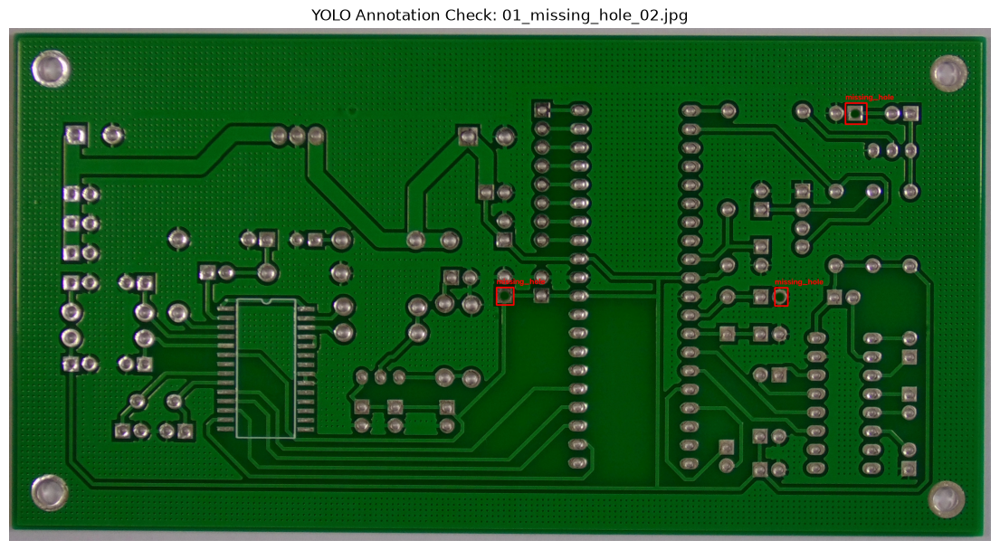

In [21]:
import cv2
import matplotlib.pyplot as plt
from pathlib import Path

# Select one training image
image_dir = project_root / "dataset" / "images" / "train"
label_dir = project_root / "dataset" / "labels" / "train"

image_file = next(image_dir.glob("*.jpg"))
label_file = label_dir / f"{image_file.stem}.txt"

# Read image
image = cv2.imread(str(image_file))
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

height, width = image.shape[:2]

# Class names
class_names = [
    "missing_hole",
    "mouse_bite",
    "open_circuit",
    "short",
    "spur",
    "spurious_copper"
]

# Read YOLO labels
with open(label_file, "r") as f:
    lines = f.readlines()

for line in lines:
    class_id, center_x, center_y, box_width, box_height = map(
        float, line.split()
    )

    class_id = int(class_id)

    # YOLO normalized coordinates → pixel coordinates
    x_center = center_x * width
    y_center = center_y * height
    w = box_width * width
    h = box_height * height

    xmin = int(x_center - w / 2)
    ymin = int(y_center - h / 2)
    xmax = int(x_center + w / 2)
    ymax = int(y_center + h / 2)

    # Draw bounding box
    cv2.rectangle(
        image,
        (xmin, ymin),
        (xmax, ymax),
        (255, 0, 0),
        3
    )

    # Add class name
    cv2.putText(
        image,
        class_names[class_id],
        (xmin, max(ymin - 10, 20)),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.8,
        (255, 0, 0),
        2
    )

plt.figure(figsize=(14, 8))
plt.imshow(image)
plt.axis("off")
plt.title(f"YOLO Annotation Check: {image_file.name}")
plt.show()

In [23]:
yaml_content = f"""path: {project_root / 'dataset'}

train: images/train
val: images/val
test: images/test

names:
  0: missing_hole
  1: mouse_bite
  2: open_circuit
  3: short
  4: spur
  5: spurious_copper
"""

yaml_file = project_root / "dataset" / "data.yaml"
yaml_file.write_text(yaml_content, encoding="utf-8")

print("data.yaml created successfully!")
print(yaml_file)

data.yaml created successfully!
C:\HOPE AI\AI Course Tamil\Week-11_Deep Learning\Deep Learning-Based PCB Defect Detection\PCB-DATASET-master\dataset\data.yaml


In [25]:
import yaml

with open(yaml_file, "r", encoding="utf-8") as f:
    data_config = yaml.safe_load(f)

print("data.yaml loaded successfully!")
print(data_config)

data.yaml loaded successfully!
{'path': 'C:\\HOPE AI\\AI Course Tamil\\Week-11_Deep Learning\\Deep Learning-Based PCB Defect Detection\\PCB-DATASET-master\\dataset', 'train': 'images/train', 'val': 'images/val', 'test': 'images/test', 'names': {0: 'missing_hole', 1: 'mouse_bite', 2: 'open_circuit', 3: 'short', 4: 'spur', 5: 'spurious_copper'}}


In [27]:
from ultralytics import YOLO

# Load YOLO model
model = YOLO("yolo11n.pt")

# Validate the dataset
results = model.val(
    data=str(yaml_file),
    split="val",
    imgsz=640,
    batch=8,
    device=0
)

print("YOLO dataset validation completed successfully!")

Ultralytics 8.4.153  Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
YOLO11n summary (fused): 100 layers, 2,616,248 parameters, 0 gradients, 6.5 GFLOPs
val: Fast image access  (ping: 0.00.0 ms, read: 2381.1287.0 MB/s, size: 1199.3 KB)
val: Scanning C:\HOPE AI\AI Course Tamil\Week-11_Deep Learning\Deep Learning-Based PCB Defect Detection\PCB-DATASET-master\dataset\labels\val.cache... 138 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 138/138 41.3Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 18/18 8.8it/s 2.0s<0.1s
                   all        138        572          0          0          0          0
                person         20         84          0          0          0          0
               bicycle         19         81          0          0          0          0
                   car         25         96          0          0          0          0
        

In [29]:
from pathlib import Path
from collections import Counter

label_root = project_root / "dataset" / "labels"

label_counts = Counter()

for split in ["train", "val", "test"]:
    split_dir = label_root / split

    for label_file in split_dir.glob("*.txt"):
        with open(label_file, "r") as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) >= 5:
                    class_id = int(parts[0])
                    label_counts[class_id] += 1

print("YOLO label class counts:")
for class_id, count in sorted(label_counts.items()):
    print(f"{class_id}: {class_names[class_id]} -> {count}")

YOLO label class counts:
0: missing_hole -> 497
1: mouse_bite -> 492
2: open_circuit -> 482
3: short -> 491
4: spur -> 488
5: spurious_copper -> 503


In [30]:
from ultralytics import YOLO

# Load pretrained YOLO11n model
model = YOLO("yolo11n.pt")

# Train on PCB defect dataset
results = model.train(
    data=str(yaml_file),
    epochs=30,
    imgsz=640,
    batch=8,
    device=0,
    workers=0,
    project=str(project_root / "models"),
    name="pcb_yolo11n",
    pretrained=True
)

print("PCB YOLO training completed!")

Ultralytics 8.4.153  Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=C:\HOPE AI\AI Course Tamil\Week-11_Deep Learning\Deep Learning-Based PCB Defect Detection\PCB-DATASET-master\dataset\data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=t

In [31]:
from pathlib import Path

training_dir = project_root / "models" / "pcb_yolo11n"

print("Training folder:")
print(training_dir)

print("\nFiles created:")
for file in training_dir.iterdir():
    print(file.name)

Training folder:
C:\HOPE AI\AI Course Tamil\Week-11_Deep Learning\Deep Learning-Based PCB Defect Detection\PCB-DATASET-master\models\pcb_yolo11n

Files created:
args.yaml
BoxF1_curve.png
BoxPR_curve.png
BoxP_curve.png
BoxR_curve.png
confusion_matrix.png
confusion_matrix_normalized.png
labels.jpg
results.csv
results.png
train_batch0.jpg
train_batch1.jpg
train_batch1220.jpg
train_batch1221.jpg
train_batch1222.jpg
train_batch2.jpg
val_batch0_labels.jpg
val_batch0_pred.jpg
val_batch1_labels.jpg
val_batch1_pred.jpg
val_batch2_labels.jpg
val_batch2_pred.jpg
weights


In [32]:
weights_dir = training_dir / "weights"

print("Weights folder:")
print(weights_dir)

print("\nModel files:")
for file in weights_dir.iterdir():
    print(file.name)

Weights folder:
C:\HOPE AI\AI Course Tamil\Week-11_Deep Learning\Deep Learning-Based PCB Defect Detection\PCB-DATASET-master\models\pcb_yolo11n\weights

Model files:
best.pt
last.pt


In [33]:
from ultralytics import YOLO

# Load the best trained PCB model
best_model = YOLO(str(weights_dir / "best.pt"))

# Evaluate on the TEST dataset
test_results = best_model.val(
    data=str(yaml_file),
    split="test",
    imgsz=640,
    batch=8,
    device=0
)

print("PCB test evaluation completed!")

Ultralytics 8.4.153  Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
YOLO11n summary (fused): 100 layers, 2,583,322 parameters, 0 gradients, 6.4 GFLOPs
val: Fast image access  (ping: 0.00.0 ms, read: 150.953.7 MB/s, size: 1264.7 KB)
val: Scanning C:\HOPE AI\AI Course Tamil\Week-11_Deep Learning\Deep Learning-Based PCB Defect Detection\PCB-DATASET-master\dataset\labels\test... 70 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 70/70 746.8it/s 0.1s
val: New cache created: C:\HOPE AI\AI Course Tamil\Week-11_Deep Learning\Deep Learning-Based PCB Defect Detection\PCB-DATASET-master\dataset\labels\test.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 1.9it/s 4.7s0.1s4
                   all         70        301      0.911      0.727      0.817      0.407
          missing_hole         17         75          1      0.928      0.992       0.59
            mouse_bite         11      

In [34]:
from pathlib import Path

test_images = list(
    (project_root / "dataset" / "images" / "test").glob("*.jpg")
)

print("Test images available:", len(test_images))
print("First test image:")
print(test_images[0])

Test images available: 70
First test image:
C:\HOPE AI\AI Course Tamil\Week-11_Deep Learning\Deep Learning-Based PCB Defect Detection\PCB-DATASET-master\dataset\images\test\01_missing_hole_07.jpg


In [35]:
# Run prediction using the trained PCB model

prediction_results = best_model.predict(
    source=str(test_images[0]),
    imgsz=640,
    conf=0.25,
    device=0,
    save=True
)

print("Prediction completed!")


image 1/1 C:\HOPE AI\AI Course Tamil\Week-11_Deep Learning\Deep Learning-Based PCB Defect Detection\PCB-DATASET-master\dataset\images\test\01_missing_hole_07.jpg: 352x640 3 missing_holes, 33.6ms
Speed: 3.8ms preprocess, 33.6ms inference, 2.1ms postprocess per image at shape (1, 3, 352, 640)
Results saved to C:\HOPE AI\AI Course Tamil\Week-11_Deep Learning\Deep Learning-Based PCB Defect Detection\notebooks\runs\detect\predict
Prediction completed!


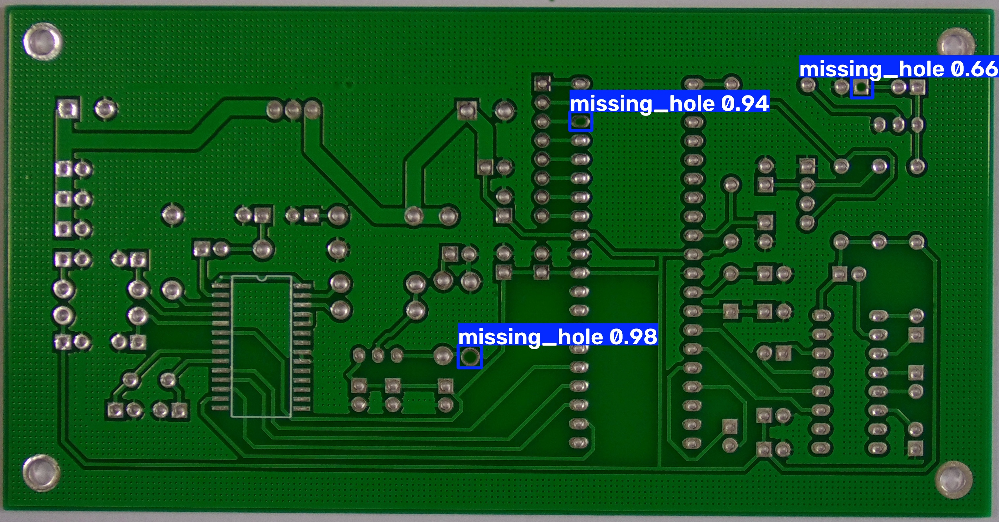

In [36]:
from IPython.display import Image, display

predicted_image = Path("runs/detect/predict") / test_images[0].name

display(Image(filename=str(predicted_image)))

In [38]:
from pathlib import Path

test_dir = project_root / "dataset" / "images" / "test"

selected_images = {}

for class_name in class_names:
    matches = list(test_dir.rglob(f"*{class_name}*.jpg"))
    
    if matches:
        selected_images[class_name] = matches[0]

print("Selected test images:")
for class_name, image_path in selected_images.items():
    print(f"{class_name}: {image_path.name}")

Selected test images:
missing_hole: 01_missing_hole_07.jpg
mouse_bite: 01_mouse_bite_13.jpg
open_circuit: 01_open_circuit_04.jpg
short: 01_short_03.jpg
spur: 01_spurious_copper_15.jpg
spurious_copper: 01_spurious_copper_15.jpg


In [39]:
from pathlib import Path

label_dir = project_root / "dataset" / "labels" / "test"
image_dir = project_root / "dataset" / "images" / "test"

selected_images = {}

for label_file in label_dir.glob("*.txt"):
    with open(label_file, "r") as f:
        lines = f.readlines()

    for line in lines:
        class_id = int(line.split()[0])
        class_name = class_names[class_id]

        if class_name not in selected_images:
            image_file = image_dir / f"{label_file.stem}.jpg"

            if image_file.exists():
                selected_images[class_name] = image_file

print("Selected test images:")
for class_name in class_names:
    if class_name in selected_images:
        print(f"{class_name}: {selected_images[class_name].name}")
    else:
        print(f"{class_name}: NOT FOUND")

Selected test images:
missing_hole: 01_missing_hole_07.jpg
mouse_bite: 01_mouse_bite_13.jpg
open_circuit: 01_open_circuit_04.jpg
short: 01_short_03.jpg
spur: 01_spur_03.jpg
spurious_copper: 01_spurious_copper_15.jpg


In [40]:
prediction_outputs = {}

for class_name, image_path in selected_images.items():
    results = best_model.predict(
        source=str(image_path),
        imgsz=640,
        conf=0.25,
        device=0,
        save=True
    )
    
    prediction_outputs[class_name] = results

    print(f"{class_name}: prediction completed")

print("\nAll 6 PCB defect predictions completed!")


image 1/1 C:\HOPE AI\AI Course Tamil\Week-11_Deep Learning\Deep Learning-Based PCB Defect Detection\PCB-DATASET-master\dataset\images\test\01_missing_hole_07.jpg: 352x640 3 missing_holes, 33.9ms
Speed: 3.9ms preprocess, 33.9ms inference, 2.7ms postprocess per image at shape (1, 3, 352, 640)
Results saved to C:\HOPE AI\AI Course Tamil\Week-11_Deep Learning\Deep Learning-Based PCB Defect Detection\notebooks\runs\detect\predict
missing_hole: prediction completed

image 1/1 C:\HOPE AI\AI Course Tamil\Week-11_Deep Learning\Deep Learning-Based PCB Defect Detection\PCB-DATASET-master\dataset\images\test\01_mouse_bite_13.jpg: 352x640 (no detections), 34.7ms
Speed: 3.8ms preprocess, 34.7ms inference, 1.1ms postprocess per image at shape (1, 3, 352, 640)
Results saved to C:\HOPE AI\AI Course Tamil\Week-11_Deep Learning\Deep Learning-Based PCB Defect Detection\notebooks\runs\detect\predict
mouse_bite: prediction completed

image 1/1 C:\HOPE AI\AI Course Tamil\Week-11_Deep Learning\Deep Learning-


missing_hole


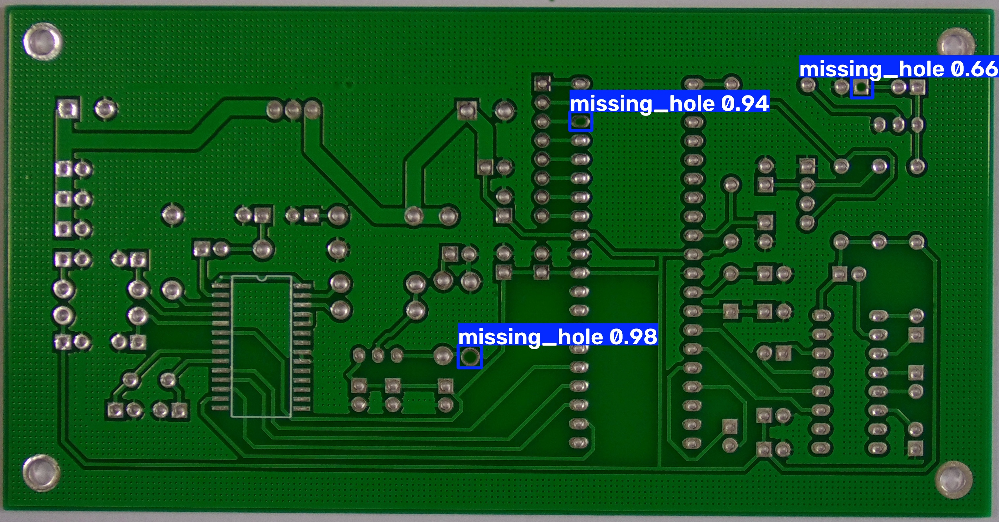


mouse_bite


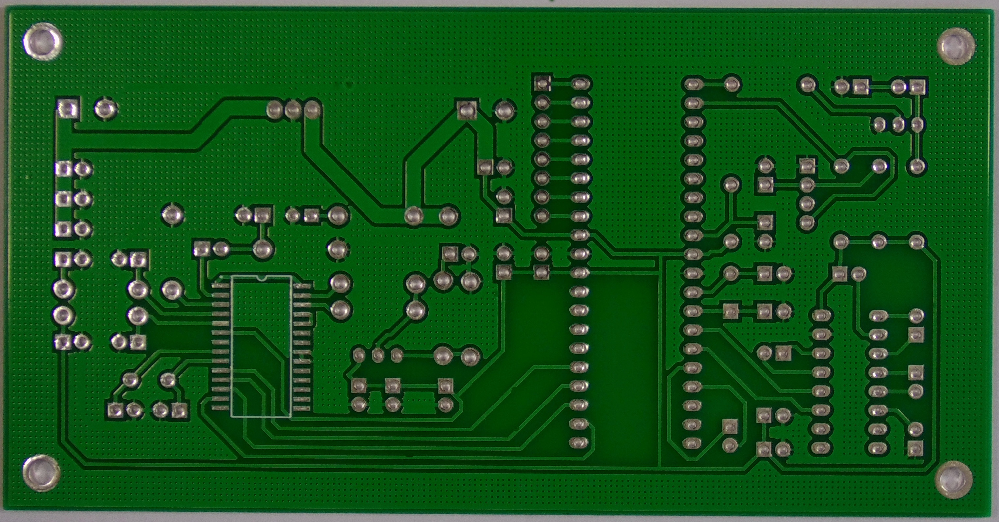


open_circuit


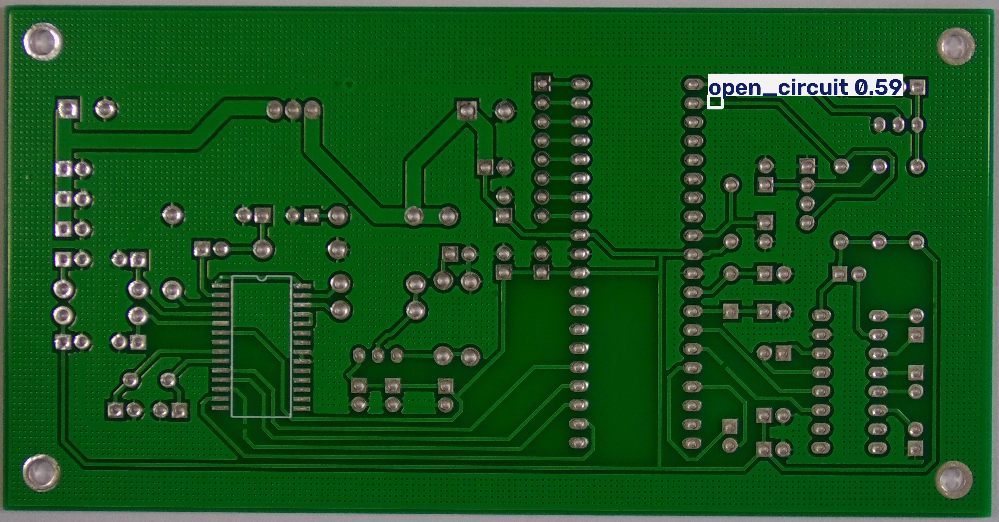


short


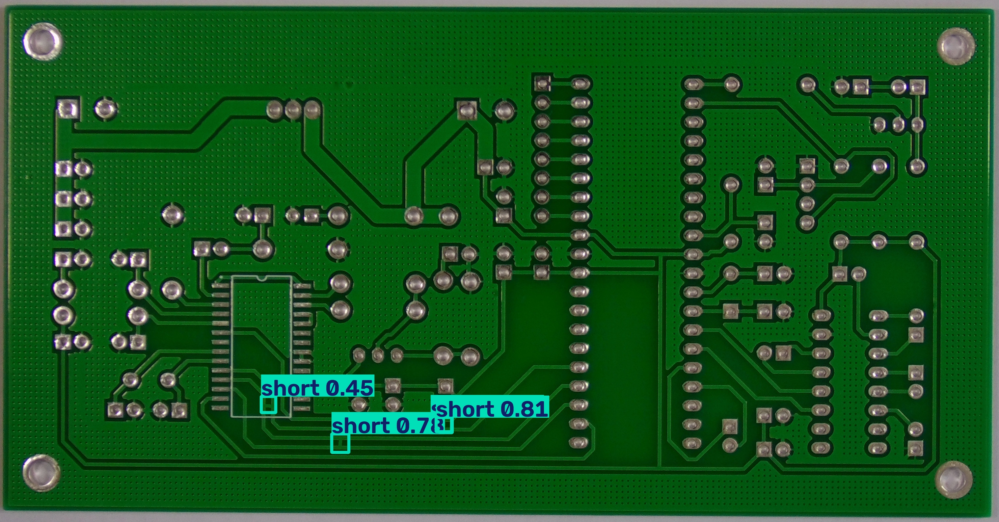


spurious_copper


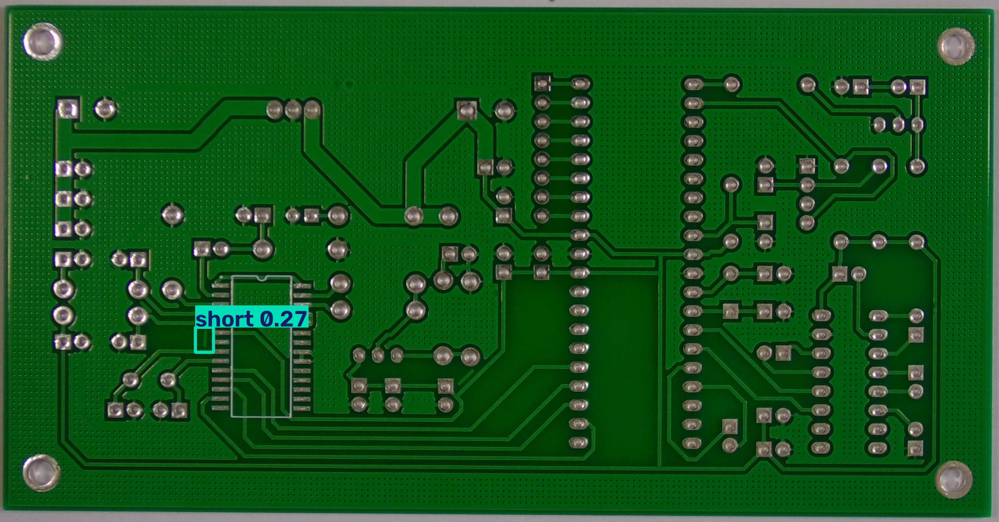


spur


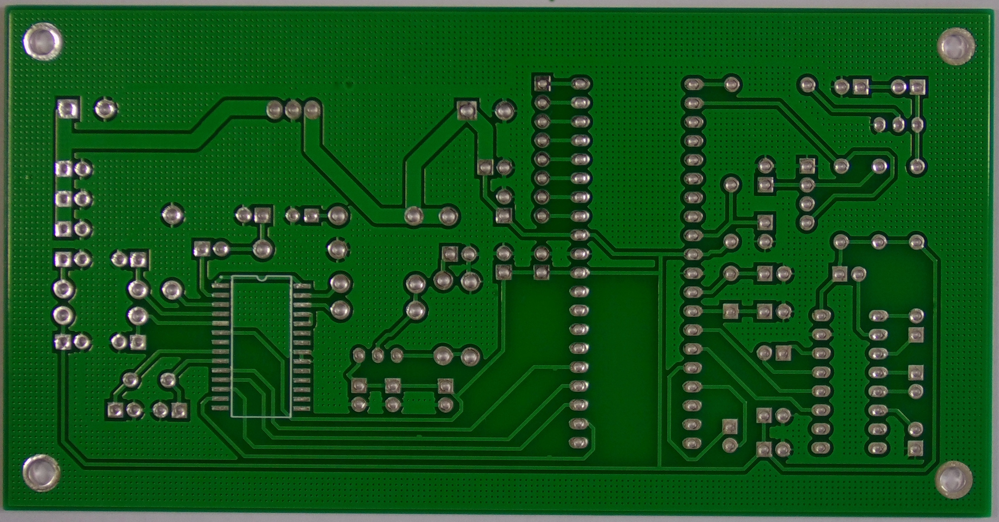

In [41]:
from IPython.display import Image, display

for class_name, results in prediction_outputs.items():
    result = results[0]
    predicted_path = Path(result.save_dir) / Path(result.path).name

    print(f"\n{class_name}")
    display(Image(filename=str(predicted_path)))

In [42]:
# PCB Quality Inspection - PASS / FAIL

def inspect_pcb(image_path, model, confidence_threshold=0.25):
    results = model.predict(
        source=str(image_path),
        imgsz=640,
        conf=confidence_threshold,
        device=0,
        verbose=False
    )

    result = results[0]

    detections = []

    for box in result.boxes:
        class_id = int(box.cls[0])
        confidence = float(box.conf[0])

        detections.append({
            "defect": class_names[class_id],
            "confidence": confidence
        })

    if len(detections) == 0:
        status = "PASS"
    else:
        status = "FAIL"

    return status, detections


# Test on the missing-hole PCB image
status, detections = inspect_pcb(
    selected_images["missing_hole"],
    best_model
)

print("PCB Inspection Result")
print("---------------------")
print("Status:", status)
print("Defects detected:", len(detections))

for detection in detections:
    print(
        f"{detection['defect']} - "
        f"{detection['confidence'] * 100:.2f}%"
    )

PCB Inspection Result
---------------------
Status: FAIL
Defects detected: 3
missing_hole - 97.68%
missing_hole - 93.51%
missing_hole - 66.49%


In [43]:
print("PCB QUALITY INSPECTION RESULTS")
print("=" * 50)

for class_name, image_path in selected_images.items():

    status, detections = inspect_pcb(
        image_path,
        best_model
    )

    print(f"\nPCB Type: {class_name}")
    print(f"Status: {status}")
    print(f"Defects detected: {len(detections)}")

    for detection in detections:
        print(
            f"  → {detection['defect']}: "
            f"{detection['confidence'] * 100:.2f}%"
        )

print("\n" + "=" * 50)
print("Inspection completed for all 6 PCB images.")

PCB QUALITY INSPECTION RESULTS

PCB Type: missing_hole
Status: FAIL
Defects detected: 3
  → missing_hole: 97.68%
  → missing_hole: 93.51%
  → missing_hole: 66.49%

PCB Type: mouse_bite
Status: PASS
Defects detected: 0

PCB Type: open_circuit
Status: FAIL
Defects detected: 1
  → open_circuit: 59.46%

PCB Type: short
Status: FAIL
Defects detected: 4
  → short: 80.59%
  → short: 77.79%
  → short: 44.53%
  → short: 28.18%

PCB Type: spurious_copper
Status: FAIL
Defects detected: 1
  → short: 27.38%

PCB Type: spur
Status: PASS
Defects detected: 0

Inspection completed for all 6 PCB images.


In [44]:
print("PCB QUALITY INSPECTION SUMMARY")
print("=" * 60)

for class_name, image_path in selected_images.items():

    status, detections = inspect_pcb(
        image_path,
        best_model
    )

    detected_classes = [d["defect"] for d in detections]

    print(f"{class_name:20} | {status:4} | "
          f"Detections: {len(detections)} | "
          f"{detected_classes}")

print("=" * 60)

PCB QUALITY INSPECTION SUMMARY
missing_hole         | FAIL | Detections: 3 | ['missing_hole', 'missing_hole', 'missing_hole']
mouse_bite           | PASS | Detections: 0 | []
open_circuit         | FAIL | Detections: 1 | ['open_circuit']
short                | FAIL | Detections: 4 | ['short', 'short', 'short', 'short']
spurious_copper      | FAIL | Detections: 1 | ['short']
spur                 | PASS | Detections: 0 | []


In [45]:
import cv2

cap = cv2.VideoCapture(0)

if cap.isOpened():
    print("Camera opened successfully!")
else:
    print("Camera could not be opened.")

cap.release()

Camera opened successfully!


In [46]:
import cv2

# Open webcam
cap = cv2.VideoCapture(0)

print("Starting live PCB detection...")
print("Press Q to stop.")

while cap.isOpened():

    ret, frame = cap.read()

    if not ret:
        print("Failed to read camera frame.")
        break

    # YOLO prediction
    results = best_model.predict(
        source=frame,
        imgsz=640,
        conf=0.25,
        device=0,
        verbose=False
    )

    # Draw YOLO detections
    annotated_frame = results[0].plot()

    # Display camera window
    cv2.imshow("PCB Defect Detection - YOLO11n", annotated_frame)

    # Press Q to quit
    if cv2.waitKey(1) & 0xFF == ord("q"):
        break

cap.release()
cv2.destroyAllWindows()

Starting live PCB detection...
Press Q to stop.


In [47]:
import cv2

cap = cv2.VideoCapture(0)

print("Starting Smart PCB Quality Inspection...")
print("Press Q to stop.")

while cap.isOpened():

    ret, frame = cap.read()

    if not ret:
        print("Failed to read camera frame.")
        break

    # YOLO prediction
    results = best_model.predict(
        source=frame,
        imgsz=640,
        conf=0.25,
        device=0,
        verbose=False
    )

    result = results[0]

    # Draw YOLO bounding boxes
    annotated_frame = result.plot()

    # Number of detected defects
    defect_count = len(result.boxes)

    # PASS / FAIL
    if defect_count > 0:
        status = "FAIL"
    else:
        status = "PASS"

    # Display status
    cv2.putText(
        annotated_frame,
        f"PCB STATUS: {status}",
        (20, 40),
        cv2.FONT_HERSHEY_SIMPLEX,
        1,
        (0, 0, 255) if status == "FAIL" else (0, 255, 0),
        2
    )

    # Display defect count
    cv2.putText(
        annotated_frame,
        f"Defects Detected: {defect_count}",
        (20, 80),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.8,
        (255, 255, 255),
        2
    )

    # Display highest confidence
    if defect_count > 0:
        max_confidence = float(result.boxes.conf.max())
        cv2.putText(
            annotated_frame,
            f"Highest Confidence: {max_confidence * 100:.1f}%",
            (20, 120),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.7,
            (255, 255, 255),
            2
        )

    cv2.imshow(
        "Smart PCB Quality Inspection - YOLO11n",
        annotated_frame
    )

    # Press Q to stop
    if cv2.waitKey(1) & 0xFF == ord("q"):
        break

cap.release()
cv2.destroyAllWindows()

Starting Smart PCB Quality Inspection...
Press Q to stop.
